Run colab:
```
colab launch //experimental/users/yilund/plato:notebook.par   -a=pufferfish=2x2x1   --borg_vars="deepsea_chip_config_name=megacore"   --xm_resource_alloc=brain/robotics-xm   --xm_resource_pool=brain   --xm_deployment_env="alphabet"   --label="language_table_notebook"
```

# Import a LAVA policy, Video RPC Servers and VLM Value Function RPC Servers, and Language-Table env

In [ ]:
#@title Imports {display-mode: "form"}
# You can now write your ugly code here
# without worrying that anyone will see it.

import datetime
import os

import jax
from language_table.eval import wrappers as lt_wrappers

from colabtools import adhoc_import
from google3.robotics import environments

with adhoc_import.Google3CitcClient('action_policy'):
  from tf_agents.environments import wrappers
  from google3.experimental.users.yilund.plato import policy as jax_policy
  from google3.experimental.users.yilund.plato.networks import lava

import tensorflow as tf
import matplotlib.pyplot as plt

from google3.learning.deepmind.visualization.python import video as video_util
import numpy as np
from copy import deepcopy

/export/hda3/borglet/remote_hdd_fs_dirs/0.yilund_language-table-high_63291438.1.kernel.yilund.3842556525916.14b334fb3717c109/mount/server/notebook.par/google3/third_party/py/tf_agents/utils/common.py:1524: SyntaxWarning: "is not" with a literal. Did you mean "!="?
/export/hda3/borglet/remote_hdd_fs_dirs/0.yilund_language-table-high_63291438.1.kernel.yilund.3842556525916.14b334fb3717c109/mount/server/notebook.par/google3/third_party/py/tf_agents/policies/tf_policy.py:243: SyntaxWarning: "is" with a literal. Did you mean "=="?
/export/hda3/borglet/remote_hdd_fs_dirs/0.yilund_language-table-high_63291438.1.kernel.yilund.3842556525916.14b334fb3717c109/mount/server/notebook.par/google3/third_party/py/tf_agents/environments/wrappers.py:335: SyntaxWarning: "is" with a literal. Did you mean "=="?


In [ ]:
#@title Imports {display-mode: "form"}

import io
import json
import os
import random
import tensorflow.compat.v2 as tf
tf.enable_v2_behavior()

import numpy as np
import jax
import jax.numpy as jnp
import PIL
from google3.pyglib import gfile
from google3.pyglib.concurrent import parallel
import numpy as np
from colabtools import monarch  # https://yaqs.corp.google.com/eng/q/1292561680357654528
from colabtools import adhoc_import
from colabtools import proto
from colabtools import stubby
import functools
with adhoc_import.Google3Head():
  import mediapy
  from universal_diffusion import image_utils
  import IPython

proto.ClearProtoDb()
proto.LoadFromFile("/google_src/head/depot/google3/experimental/brain/diffuse_rl/google/mp/rpc/rpc.proto")
proto_lib_exp = proto.db.experimental.brain.diffuse_rl.google.mp.rpc

import tensorflow_datasets as tfds


from google3.learning.brain.google.python import data as tf_data_google

In [ ]:
#@title Imports {display-mode: "form"}

import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import functools
import glob

import seqio

import PIL
import io

from google3.pyglib import gfile

from google3.learning.serving.apis import prediction_service_pb2
from google3.net.rpc2.contrib.smartservice.python import smartservice_util
from google3.third_party.tensorflow_serving.apis import predict_pb2

import numpy as np

from timeit import default_timer as timer

import gin
gin.enter_interactive_mode()

from colabtools import adhoc_import

#import mediapy as media

with adhoc_import.Google3():
  from google3.experimental.users.dannydriess.RFM.utils import generate_extra_id_str
  from google3.experimental.users.dannydriess.RFM.tasks import task_utils


EVAL_AUGMENT = task_utils.FrameAugmentation.EVAL_AUGMENT

gin.parse_config('task_utils.process_frame.normalize_image = False')

([], [])

In [ ]:
BNS_VALUE = '/bns/ge/borg/ge/bns/yilund/yilund_group_65373063.1.server/0:rpc'
BNS_VALUE = '/bns/ge/borg/ge/bns/yilund/yilund_group_67205681.1.server/0:rpc'
BNS_VALUE = '/bns/ge/borg/ge/bns/yilund/yilund_group_67205681.1.server/0:rpc'
BNS_VALUE = '/bns/ge/borg/ge/bns/yilund/yilund_group_67641948.1.server/0:rpc'

stub_value = smartservice_util.new_stub(prediction_service_pb2.PredictionService, smartservice_util.parse(BNS_VALUE))

def query_RFM(prompt, continuous_inputs, temp=0.0):
  request = predict_pb2.PredictRequest()
  if type(prompt) is list:
    request.inputs['input_text'].CopyFrom(tf.make_tensor_proto(prompt))
  else:
    request.inputs['input_text'].CopyFrom(tf.make_tensor_proto([prompt]))
  request.inputs['inference_mode'].CopyFrom(tf.make_tensor_proto('predict'))
  request.inputs['continuous_inputs_scene'].CopyFrom(tf.make_tensor_proto(continuous_inputs))
  request.inputs['max_decode_steps'].CopyFrom(tf.make_tensor_proto(40))  # this number determines how many steps are being decoded
  request.inputs['temperature'].CopyFrom(tf.make_tensor_proto(temp))

  response = stub_value.Predict(request)
  return tf.make_ndarray(response.outputs['output_text'])[:,0]

def query_RFM_best_of_k(prompt, continuous_inputs, temp=0.0, best_of_k=2):
  request = predict_pb2.PredictRequest()
  request.inputs['input_text'].CopyFrom(tf.make_tensor_proto([prompt] * best_of_k))
  request.inputs['inference_mode'].CopyFrom(tf.make_tensor_proto('predict'))

  request.inputs['continuous_inputs_scene'].CopyFrom(tf.make_tensor_proto(tf.repeat(continuous_inputs, best_of_k, 0)))
  request.inputs['max_decode_steps'].CopyFrom(tf.make_tensor_proto(40))  # this number really
  request.inputs['temperature'].CopyFrom(tf.make_tensor_proto(temp))

  response = stub_value.Predict(request)

  scores = tf.make_ndarray(response.outputs['scores'])[:,0]
  texts = tf.make_ndarray(response.outputs['output_text'])[:,0]
  max_id = np.argmax(scores)
  print(texts, scores)
  return texts[max_id]

def tf_to_str(s):
  return s.numpy().decode('utf8')

prefix = generate_extra_id_str(256, 0)

In [ ]:
BNS_POLICY = '/bns/gl/borg/gl/bns/yilund/yilund_group_64089369.1.server/0:rpc'
# New model under vpd
BNS_POLICY = "/bns/uy/borg/uy/bns/yilund/yilund_group_65371039.1.server/0:rpc"
BNS_POLICY = "/bns/dy/borg/dy/bns/yilund/yilund_group_67207338.1.server/0:rpc"
BNS_POLICY = "/bns/dy/borg/dy/bns/yilund/yilund_group_67849325.1.server/0:rpc"

stub_query = smartservice_util.new_stub(prediction_service_pb2.PredictionService, smartservice_util.parse(BNS_POLICY))

def query_RFM_policy(prompt, continuous_inputs, temp=0.0):
  request = predict_pb2.PredictRequest()

  if type(prompt) is list:
    request.inputs['input_text'].CopyFrom(tf.make_tensor_proto(prompt))
  else:
    request.inputs['input_text'].CopyFrom(tf.make_tensor_proto([prompt]))

  request.inputs['inference_mode'].CopyFrom(tf.make_tensor_proto('predict'))
  request.inputs['continuous_inputs_scene'].CopyFrom(tf.make_tensor_proto(continuous_inputs))
  request.inputs['max_decode_steps'].CopyFrom(tf.make_tensor_proto(40))  # this number determines how many steps are being decoded
  request.inputs['temperature'].CopyFrom(tf.make_tensor_proto(temp))

  response = stub_query.Predict(request)
  return tf.make_ndarray(response.outputs['output_text'])[:, 0]


In [ ]:
BNS_RT2 = "/bns/ge/borg/ge/bns/yilund/yilund_group_67168150.1.server/0:rpc"

stub_rt2 = smartservice_util.new_stub(prediction_service_pb2.PredictionService, smartservice_util.parse(BNS_RT2))

def query_RFM_rt2(prompt, continuous_inputs, temp=0.0):
  request = predict_pb2.PredictRequest()

  if type(prompt) is list:
    request.inputs['input_text'].CopyFrom(tf.make_tensor_proto(prompt))
  else:
    request.inputs['input_text'].CopyFrom(tf.make_tensor_proto([prompt]))

  request.inputs['inference_mode'].CopyFrom(tf.make_tensor_proto('predict'))
  request.inputs['continuous_inputs_scene'].CopyFrom(tf.make_tensor_proto(continuous_inputs))
  request.inputs['max_decode_steps'].CopyFrom(tf.make_tensor_proto(40))  # this number determines how many steps are being decoded
  request.inputs['temperature'].CopyFrom(tf.make_tensor_proto(temp))

  response = stub_rt2.Predict(request)
  return tf.make_ndarray(response.outputs['output_text'])[:, 0]


In [ ]:
import time

In [ ]:
# Import RPC Servers
# T5_BNS = ["/bns/gm/borg/gm/bns/sherryy/sherryy_group_59360669.1.t5_rpc/0",]
# T5_BNS = ["/bns/rs/borg/rs/bns/yilund/yilund_group_63304658.1.t5_rpc/0",]
T5_BNS = ["/bns/ge/borg/ge/bns/yilund/yilund_group_65886932.1.t5_rpc/0"]

def repeat_faxis(x, n=2):
  print(x.shape, n)
  if n == 1:
    return x
  B, F, H, W, C = x.shape
  if F == 1:
    x = np.reshape(x, (B, F, 1, H, W, C))
    x = np.broadcast_to(x, (B, F, n, H, W, C))
    return np.reshape(x, (B, n*F, H, W, C))

  prefix = x
  x = x[:, -1:, ...]
  x = np.broadcast_to(x, (B, n - F, H, W, C))
  x = np.concatenate([prefix, x], axis=1)
  print('repeat_faxis', x.shape)
  return x


def np_to_bytes(x: np.ndarray):
  m = io.BytesIO()
  np.save(m, x)
  return m.getvalue()

def bytes_to_np(b: bytes):
  m = io.BytesIO(b)
  return np.load(m, allow_pickle=True)

def t5_rpc(text: str, experimental=True):
  bns = random.choice(T5_BNS)
  request = proto_lib_exp.T5Request() if experimental else proto_lib.T5Request()
  request.text.append(text)
  response = stubby.Call(bns, "T5Server.Compute", request)
  return bytes_to_np(response.text_embs)

def model_rpc(*, bns, text, sampler_hparams=None, cond_frames=None, mode="base",
              src_frames=None, experimental=False,
              teacher_cond_frames=None, teacher_text=None, src_text_embs=None):
  if isinstance(bns, list):
    bns = random.choice(bns)
  if sampler_hparams is None:
    sampler_hparams = {}
  request = proto_lib_exp.SampleRequest() if experimental else proto_lib.SampleRequest()
  request.sampler_hparams = json.dumps(sampler_hparams)

  if src_text_embs is not None:
    request.src_text_embs = src_text_embs
  elif text is not None:
    while True:
      try:
        if type(text) is list:
          text_emb = []
          for t, repeat in text:
            data_val = t5_rpc(t, experimental=experimental)
            text_emb.extend([data_val for _ in range(repeat)])

          text_emb = np.stack(text_emb, axis=0, dtype=data_val.dtype)
          print("text_emb shape: ", text_emb.shape)
          print("cond_frames shape: ", cond_frames.shape)
          request.src_text_embs = np_to_bytes(text_emb)
          break
        else:
          request.src_text_embs = np_to_bytes(t5_rpc(text, experimental=experimental))  # required
          if teacher_text is not None:
            request.teacher_text_embs = np_to_bytes(t5_rpc(teacher_text, experimental=experimental))  # required
          break

      except Exception as e:
        print('t5 RPC failed')
        break
        continue

  if mode == "tsr":
    request.src_video = np_to_bytes(repeat_faxis(cond_frames))
  elif mode == "ssr":
    request.src_cond_video = np_to_bytes(cond_frames)
  else:
    assert mode == "base"
    if cond_frames is not None:
      if "16x24x40" in bns:
        n = 16
      elif "10x48x64" in bns:
        n = 10
      else:
        raise ValueError
      if cond_frames.shape[1] < n:
        cond_frames = repeat_faxis(cond_frames, n=n)
      request.src_video = np_to_bytes(cond_frames)
    if teacher_cond_frames is not None:
      if teacher_cond_frames.shape[1] == 1:
        teacher_cond_frames = repeat_faxis(teacher_cond_frames, n=16)
      request.teacher_cond_video = np_to_bytes(teacher_cond_frames)

  response = None
  while True:
    try:
      response = stubby.Call(bns, "UniversalDiffusionModelServer.Sample", request)
      break
    except Exception as e:
      print(e)
      print('video rpc failed')
      break
      continue

  out = np.clip(bytes_to_np(response.samples), 0, 255)
  if mode == "base":
    return out, request.src_text_embs #, bytes_to_np(response.likelihood)
  else:
    return out, request.src_text_embs

def maybe_collage(frames):
  if frames.ndim == 4:
    return frames
  assert frames.ndim == 5
  tiled_frames = np.stack([
      image_utils.create_collage(frames[:, i_frame], dtype=np.uint8)
      for i_frame in range(frames.shape[1])])
  assert (tiled_frames.ndim == 4 and
          tiled_frames.shape[0] == frames.shape[1] and
          tiled_frames.shape[-1] == frames.shape[-1])
  return tiled_frames



def visualize(frames, fps=24, framesize=(192, 320), mark_eov=False, crf=23):
  if isinstance(frames, (list, tuple)):
    frames = np.concatenate(frames, axis=1)
  if frames.dtype != np.uint8:
    frames = np.clip(np.rint(frames), 0, 255).astype(np.uint8)
  if frames.ndim == 4:
    frames = frames[None]
  B, F, H, W, C = frames.shape
  if mark_eov:
    # Mark end of video with 1 sec of black.
    end_frames = np.zeros((B, fps, H, W, C), dtype=frames.dtype)
    frames = np.concatenate([frames, end_frames], axis=1)
  tiled_frames = maybe_collage(frames)
  print(f"duration: {F/fps:.2f} sec. shape={(B, F, H, W, C)}")
  n_rows = tiled_frames.shape[-3] / H
  n_cols = tiled_frames.shape[-2] / W
  vid_h = n_rows * framesize[0]
  vid_w = n_cols * framesize[1]
  b64 = mediapy.html_from_compressed_video(mediapy.compress_video(tiled_frames, fps=fps, crf=crf), width=vid_w, height=vid_h)
  IPython.display.display(IPython.display.HTML(b64))

In [ ]:
class RemoteFileWrapper(object):
  """Makes a local temp copy of a file in CNS so it can be changed locally.

  OpenCV and PIL don't have wrappers to handle GFile, so a lot of boiler plate
  copying locally, manipulating the image and writing it back to its location.
  This also cleans up the temp file when done.

  NOTE: Requires you call del manually to clean up the object.
  """

  def __init__(self, filename, should_writeback=True):
    self._remote_filename = filename
    file_handle, self._local_tmp_filename = tempfile.mkstemp(
        os.path.splitext(os.path.basename(filename))[1])
    os.close(int(file_handle))

    if gfile.Exists(self._remote_filename):
      gfile.Copy(self._remote_filename, self._local_tmp_filename, True)
    self._should_writeback = should_writeback

  def GetFilename(self):
    return self._local_tmp_filename

  def Flush(self):
    """Writes results back to remote file."""
    if self._should_writeback:
      gfile.Copy(self._local_tmp_filename, self._remote_filename, True)

  def __del__(self):
    """Deletes the python object.

    You must call this function manually to flush changes and delete the
    local file.
    """
    self.Flush()
    gfile.Remove(self._local_tmp_filename)

In [ ]:
def process(file_list):
  d = tf_data_google.SSTableDataset(file_list)

  def central_crop(input_, *, width_over_height: float):
    """LargestCenterCrop transform."""
    in_shape = tf.shape(input_)
    H, W = in_shape[-3], in_shape[-2]  # pylint: disable=invalid-name
    aspect_ratio = width_over_height
    w_from_aspect_ratio = tf.cast(
        tf.cast(H, tf.float32) * aspect_ratio, tf.int32)
    h_from_aspect_ratio = tf.cast(
        tf.cast(W, tf.float32) / aspect_ratio, tf.int32)
    # Height/width of our crop.
    h = tf.minimum(H, h_from_aspect_ratio)
    w = tf.minimum(W, w_from_aspect_ratio)
    # Location of our crop.
    x = (H - h) // 2
    y = (W - w) // 2
    cropped = input_[..., x:x+h, y:y+w, :]
    return cropped

  def process_example(example):
    ex = tf.io.parse_single_example(example, {
      "video": tf.io.VarLenFeature(tf.string),
      "texts": tf.io.VarLenFeature(tf.string),
      "t5_tokens": tf.io.FixedLenFeature([], tf.string),
      "t5_mask": tf.io.FixedLenFeature([], tf.string),
      "t5_embs": tf.io.FixedLenFeature([], tf.string),
    })
    num_frames = 16
    num_frames_subsample = 4
    total_frames_num = (num_frames - 1) * num_frames_subsample + 1
    video = tf.sparse.to_dense(ex["video"])[:total_frames_num]
    num_repeats = total_frames_num - tf.shape(video)[0]
    video = tf.concat([video, tf.tile(video[None, -1], [num_repeats])], axis=0)
    video = tf.ensure_shape(video, [total_frames_num])
    if num_frames_subsample > 1 and num_frames > 1:
      video = video[::num_frames_subsample]
    decode_fn = lambda x: tf.reshape(tf.io.decode_raw(x, tf.uint8), [360, 640, 3])
    video = tf.map_fn(decode_fn, video, fn_output_signature=tf.uint8)
    sobel = tf.image.sobel_edges(tf.cast(tf.image.rgb_to_grayscale(video), tf.float32))[..., 0]
    cond_video = tf.repeat(255 - sobel, 3, axis=-1)
    video = tf.cast(video, tf.float32)
    video = tf.clip_by_value(video, 0, 255)
    cond_video = tf.clip_by_value(cond_video, 0, 255)
    orig_video = tf.ensure_shape(video, [num_frames, None, None, 3])
    cond_video = tf.ensure_shape(cond_video, [num_frames, None, None, 3])
    out = {}
    out['orig_video'] = orig_video
    out['orig_cond'] = cond_video
    orig_video = tf.concat([orig_video, cond_video], axis=0)

    F, H, W, C = (16, 24, 40, 3)
    cropped = central_crop(orig_video, width_over_height=float(W) / float(H))
    resized = tf.clip_by_value(
        tf.image.resize(cropped, [H, W], method="bilinear", antialias=True),
        0, 255)
    resized, cond_video = tf.split(resized, 2, axis=0)
    resized = tf.ensure_shape(resized, [F, H, W, C])
    out["video"] = resized
    out["resized_video"] = cond_video
    out["text"] = tf.sparse.to_dense(ex["texts"])[0]

    return out

  d = d.map(lambda _, x: process_example(example=x))
  videos, cond_videos, texts, orig_videos, orig_conds = [], [], [], [], []
  for record in d:
    videos.append(record["video"].numpy())
    cond_videos.append(record["resized_video"].numpy())
    texts.append(record["text"].numpy())
    orig_videos.append(record["orig_video"].numpy())
    orig_conds.append(record["orig_cond"].numpy())
  return videos, cond_videos, texts, orig_videos, orig_conds

In [ ]:
def central_crop(input_, *, width_over_height: float):
    """LargestCenterCrop transform."""
    in_shape = tf.shape(input_)
    H, W = in_shape[-3], in_shape[-2]  # pylint: disable=invalid-name
    aspect_ratio = width_over_height
    w_from_aspect_ratio = tf.cast(
        tf.cast(H, tf.float32) * aspect_ratio, tf.int32)
    h_from_aspect_ratio = tf.cast(
        tf.cast(W, tf.float32) / aspect_ratio, tf.int32)
    # Height/width of our crop.
    h = tf.minimum(H, h_from_aspect_ratio)
    w = tf.minimum(W, w_from_aspect_ratio)
    # Location of our crop.
    x = (H - h) // 2
    y = (W - w) // 2
    cropped = input_[..., x:x+h, y:y+w, :]
    return cropped



def prep_environment(orig_video):
    orig_video = orig_video * 255.
    F, H, W, C = (16, 24, 40, 3)
    cropped = central_crop(orig_video, width_over_height=float(W) / float(H))
    resized = tf.clip_by_value(
        tf.image.resize(cropped, [H, W], method="bilinear", antialias=True),
        0, 255)

    return resized

In [ ]:
# Update the BNS addresses with your custom ones below


BNS = {
    "langtable_base": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372394.1.rpc_base_16x24x40fs8_58130125/0",
    "langtable_ssr1": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372120.1.rpc_ssr_8x24x40fs4_to_8x48x80fs4_56611001/0",
    'langtable_ssr2': "/bns/gl/borg/gl/bns/yilund/yilund_group_65372161.1.rpc_ssr_8x48x80fs4_to_8x192x320fs4_56611640/0",
    "langtable_highres_base": "/bns/gh/borg/gh/bns/sherryy/sherryy_group_61913229.1.rpc_base_16x24x40fs8_60579040/0",
    # "langtable_ssr1": "/bns/gh/borg/gh/bns/sherryy/sherryy_rpc_ssr_8x24x40fs4_to_8x48x80fs4_56611001_58213164.1.tpu_rpc_server/0",
    # "langtable_ssr2": "/bns/gh/borg/gh/bns/sherryy/sherryy_rpc_ssr_8x48x80fs4_to_8x192x320fs4_56611640_58212811.1.tpu_rpc_server/0",
}

BNS = {
    "langtable_long_horizon": "/bns/ge/borg/ge/bns/yilund/yilund_group_66553914.1.long_horizon_video_gen/0",
    "langtable_base": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372394.1.rpc_base_16x24x40fs8_58130125/0",
    # "langtable_ssr1": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372120.1.rpc_ssr_8x24x40fs4_to_8x48x80fs4_56611001/0",
    # 'langtable_ssr2': "/bns/gl/borg/gl/bns/yilund/yilund_group_65372161.1.rpc_ssr_8x48x80fs4_to_8x192x320fs4_56611640/0",
    "langtable_highres_base": "/bns/gh/borg/gh/bns/sherryy/sherryy_group_61913229.1.rpc_base_16x24x40fs8_60579040/0",
    # "langtable_ssr1": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372120.1.rpc_ssr_8x24x40fs4_to_8x48x80fs4_56611001/0",
    # 'langtable_ssr2': "/bns/gl/borg/gl/bns/yilund/yilund_group_65372161.1.rpc_ssr_8x48x80fs4_to_8x192x320fs4_56611640/0",
    # "langtable_ssr1": "/bns/ge/borg/ge/bns/yilund/yilund_group_65887953.1.rpc_ssr_8x24x40fs4_to_8x48x80fs4_56611001/0",
    # "langtable_ssr2": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372161.1.rpc_ssr_8x48x80fs4_to_8x192x320fs4_5661164/0",
    "langtable_ssr1": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372120.1.rpc_ssr_8x24x40fs4_to_8x48x80fs4_56611001/0",
    "langtable_ssr2": "/bns/gl/borg/gl/bns/yilund/yilund_group_65372161.1.rpc_ssr_8x48x80fs4_to_8x192x320fs4_56611640/0",
}

# BNS = {
#     "langtable_base": "/bns/ge/borg/ge/bns/sherryy/sherryy_group_65755085.1.rpc_base_16x24x40fs8_65555056/0",
#     "langtable_ssr1": "/bns/ge/borg/ge/bns/sherryy/sherryy_group_65755179.1.rpc_ssr_8x24x40fs4_to_8x48x80fs4_56611001/0",
#     'langtable_ssr2': "/bns/ge/borg/ge/bns/sherryy/sherryy_group_65755269.1.rpc_ssr_8x48x80fs4_to_8x192x320fs4_56611640/0",
# }

In [ ]:
videos, cond_videos, texts, orig_videos, orig_conds = process(
    #['/cns/li-d/home/sherryy/diffuse_rl/data/language_table_sim_all/validation-0000{}-of-00144'.format(i) for i in range(1)]
    ['/cns/li-d/home/sherryy/diffuse_rl/data/language_table_all/validation-0000{}-of-00219'.format(i) for i in range(1)]
    )

In [ ]:
def generate_video(prompt, video):
  try:
    samples = {}

    samples["base"], src_text_embs = model_rpc(bns=BNS["langtable_base"],
                                experimental=True,
                                cond_frames=video,
                                text=prompt,
                                sampler_hparams=dict(cond_coef=5.0, eval_cond_logsnr=5.0,
                                                    teacher_coef=0.0, num_sampling_steps=16))
    samples["ssr1"], _ = model_rpc(bns=BNS["langtable_ssr1"], text=None, mode="ssr", cond_frames=samples["base"],
                              sampler_hparams=dict(cond_coef=5.0, eval_cond_logsnr=5.0, num_sampling_steps=4), experimental=True,
                                src_text_embs=src_text_embs)
    samples["ssr2"], _ = model_rpc(bns=BNS["langtable_ssr2"], text=None, mode="ssr", cond_frames=samples["ssr1"],
                              sampler_hparams=dict(cond_coef=5.0, eval_cond_logsnr=5.0, num_sampling_steps=4), experimental=True,
                                src_text_embs=src_text_embs)
    return samples
  except Exception as e:
    print("Exception: ", e)
    time.sleep(60)
    return generate_video(prompt, video)

In [ ]:
def generate_action(image, goal, n=2, temp=0.0):

  image_first = tf.convert_to_tensor(np.asarray(image)[:,:,:3])
  image_first = task_utils.process_frame(image_first, img_size=(224, 224), augmentation=EVAL_AUGMENT)[None, None]

  im_process = image_first

  im_process_list = tf.concat([im_process for i in range(n)], axis=0)
  prompt = [f'Given {prefix}. Q: What is the next text command to accomplish {goal}? A:' for i in range(n)]
  instruction_list = []

  pred_list = query_RFM_policy(prompt, im_process_list, temp=temp)
  instruction_list = [pred.decode('utf-8').split('.')[0] for pred in pred_list]

  return instruction_list

In [ ]:
def generate_action_rt2(image, n=2, temp=0.0):

  image_first = tf.convert_to_tensor(np.asarray(image)[:,:,:3])
  image_first = task_utils.process_frame(image_first, img_size=(224, 224), augmentation=EVAL_AUGMENT, normalize_image=True)[None, None]

  im_process = image_first

  im_process_list = tf.concat([im_process for i in range(n)], axis=0)
  prompt = [f'Given {prefix}. Q: What is the next text command to accomplish  stacking cups, bowl and utensils? A:' for i in range(n)]
  instruction_list = []

  pred_list = query_RFM_rt2(prompt, im_process_list, temp=temp)
  instruction_list = [pred.decode('utf-8').split('.')[0] for pred in pred_list]

  return instruction_list

In [ ]:
def value_function(images, goal):

  im_process_list = []

  for image in images:
    image_first = tf.convert_to_tensor(np.asarray(image)[:,:,:3])
    image_first = task_utils.process_frame(image_first, img_size=(224, 224), augmentation=EVAL_AUGMENT)[None, None]
    im_process = image_first
    im_process_list.append(im_process)

  im_process = tf.concat(im_process_list, axis=0)


  prompt = [f'Given {prefix}. Q: How many steps are there to accomplish {goal}? A:' for image in images]

  pred_list = query_RFM(prompt, im_process)

  pred_list = [p.decode('utf-8') for p in pred_list]

  steps = [-1 * float(pred.split('.')[0]) for pred in pred_list]
  return np.array(steps)

In [ ]:
idx = 20
cond_video, cond_frames, prompt, orig_video, orig_cond = list(zip(videos, cond_videos, texts, orig_videos, orig_conds))[idx]

# prompt = "Slide the green star left."
video_util.display(orig_video / 255., 6)

In [ ]:
idx = 3
cond_video, cond_frames, prompt, orig_video, orig_cond = list(zip(videos, cond_videos, texts, orig_videos, orig_conds))[idx]

# prompt = "Slide the green star left."
video_util.display(orig_video / 255., 6)

In [ ]:
cond_video.shape

(16, 24, 40, 3)

In [ ]:
horizon = 8
beam_width = 1

init_video = cond_video[:1, ...].repeat(16, axis=0)
hi_res_video = orig_video[:1, ...].repeat(16, axis=0)
# goal = "put all the blocks in a horizontal line"
# goal = "put all the blocks in the bottom right"
goal = "group the blocks by color"
# goal = "surround the green circles with the others"
# goal = 'make a "T"" shape out of all the blocks'
# goal = 'make a "triangle"" shape out of all the blocks'

# goal = "put the yellow and green blocks together in a group, then put the red and blue blocks together in a group"

plans = [[("start instruction", {'base': init_video, 'ssr2': hi_res_video})] for i in range(beam_width)]

In [ ]:
for h in range(horizon):
  print("horizon: ", h)
  scores = []

  for b in range(beam_width):
    print("batch: ", b)
    select_plan = plans[b][h]
    lang_struction, video = select_plan
    print(lang_struction)

    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]

    actions = generate_action(im_obs, goal, n=16, temp=0.1)
    print(actions)

    ntext = len(actions)
    ntile = 16
    ndiv = ntile // ntext
    remainder = ntile - ndiv * ntext

    text = [(action, ndiv) for action in actions]

    for i in range(remainder):
      action, val = text[i]
      text[i] = action, val + 1

    actions = []
    for i in range(len(text)):
      actions.extend([text[i][0]] * text[i][1])

    new_videos = []
    new_video = generate_video(text, base_video[None, -1:].repeat(ntile, axis=0).repeat(16, axis=1))
    new_videos.append(new_video)

    collate_videos = {}

    keys = list(new_video.keys())
    for key in keys:
      collate_videos[key] = np.concatenate([new_video[key] for new_video in new_videos], axis=0)

    new_video = collate_videos

    base_frames = [new_video['ssr2'][i, -1] for i in range(ntile)]

    gen_score = value_function(base_frames, goal)

    print("overall scores", gen_score)

    # gen_score = np.array([value_function(base_frame, goal) for base_frame in base_frames])

    score, select_idx = np.max(gen_score), np.argmax(gen_score)

    action = actions[select_idx]

    print("plan steps: ", score)
    for key in keys:
      new_video[key] = new_video[key][select_idx]

    plans[b].append((action, new_video))
    scores.append(score)

  for plan in plans:
    print(len(plan))

  min_idx, max_idx = np.argmin(scores), np.argmax(scores)

  # if (h != horizon - 1) and (h % 2 == 0):
    # plans[min_idx] = deepcopy(plans[max_idx])

  # Remove the worst plan in the horizon with a better one

horizon:  0
batch:  0
start instruction
['move the yellow heart to the top left of the yellow hexagon', 'move the yellow heart to the top left of the yellow hexagon', 'move the yellow heart to the top left of the yellow hexagon', 'slide the yellow heart to the yellow hexagon', 'move the yellow heart to the top left of the yellow hexagon', 'move the yellow heart to the top left of the green circle', 'move the yellow heart to the top left of the yellow hexagon', 'slide the yellow heart to the yellow hexagon', 'move the yellow heart to the top left of the yellow hexagon', 'move the yellow heart to the top left of the yellow hexagon', 'move the yellow heart to the top left of the yellow hexagon', 'slide the yellow heart to the yellow hexagon', 'move the yellow heart to the top left of the green circle', 'move the yellow heart to the top left of the green circle', 'move the yellow heart to the top left of the yellow hexagon', 'move the yellow heart to the top left of the green circle']
text

In [ ]:
ssr2_videos = [a[1]['ssr2'] for a in plans[0][1:]]

In [ ]:
ssr2_video = np.concatenate(ssr2_videos, axis=0)

In [ ]:
visualize(ssr2_video, fps=6)

duration: 21.33 sec. shape=(1, 128, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 21.33 sec. shape=(1, 128, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 24.00 sec. shape=(1, 144, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 21.33 sec. shape=(1, 128, 192, 320, 3)


In [ ]:
image = np.concatenate([image_first, image_second], axis=1)

In [ ]:
videos, cond_videos, texts, orig_videos, orig_conds = process(
    ['/cns/li-d/home/sherryy/diffuse_rl/data/language_table_sim_all/validation-0000{}-of-00144'.format(i) for i in range(1)]
    )

In [ ]:
idx = 6
cond_video, cond_frames, prompt, orig_video, orig_cond = list(zip(videos, cond_videos, texts, orig_videos, orig_conds))[idx]

# prompt = "Slide the green star left."
video_util.display(orig_video / 255., 6)

In [ ]:
horizon = 8
beam_width = 1

init_video = cond_video[:1, ...].repeat(16, axis=0)
hi_res_video = orig_video[:1, ...].repeat(16, axis=0)

goal = "group the blocks by color"
goal = 'make a "X" shape out of all the blocks'
goal = 'put 1 blocks in the top center, then the rest in the bottom right corner'
goal = 'make a rainbow out of the blocks (red, yellow, green, blue in a semicircle)'
goal = 'surround the blue cube with the others'
goal = 'put 3 blocks in the top left corner, then the rest in the top right corner'
goal = 'make one horizontal line out of the blue and yellow blocks, then make a horizontal line out of the red and green blocks'

plans = [[("start instruction", {'base': init_video, 'ssr2': hi_res_video})] for i in range(beam_width)]

In [ ]:
def generate_plan(goal, plans, horizon=8, beam_width=1):

  for h in range(horizon):
    print("horizon: ", h)
    scores = []

    for b in range(beam_width):
      print("batch: ", b)
      select_plan = plans[b][-1]
      lang_struction, video = select_plan

      base_video = video['base']
      ssr2_video = video['ssr2']
      im_obs = ssr2_video[-1]

      actions = generate_action(im_obs, goal, n=4, temp=0.3)

      ntext = len(actions)
      ntile = 16
      ndiv = ntile // ntext
      remainder = ntile - ndiv * ntext

      text = [(action, ndiv) for action in actions]

      for i in range(remainder):
        action, val = text[i]
        text[i] = action, val + 1

      actions = []
      for i in range(len(text)):
        actions.extend([text[i][0]] * text[i][1])

      new_videos = []
      new_video = generate_video(text, base_video[None, -1:].repeat(ntile, axis=0).repeat(16, axis=1))
      new_videos.append(new_video)

      collate_videos = {}

      keys = list(new_video.keys())
      for key in keys:
        collate_videos[key] = np.concatenate([new_video[key] for new_video in new_videos], axis=0)

      new_video = collate_videos

      # Compute value function of last state
      base_frames = [new_video['ssr2'][i, -1] for i in range(ntile)]
      gen_score = value_function(base_frames, goal)

      # Compute value function of first state

      # if len(plans[b]) == 1:
      #   base_frames_first = [new_video['ssr2'][i, 0] for i in range(ntile)]
      # else:
      base_frames_first = [im_obs for i in range(ntile)]

      gen_score_first = value_function(base_frames_first, goal)


      # Penalize deviations that are too large (likely due to infeasible physics)
      diff = np.abs(gen_score - gen_score_first) > 60
      gen_score[diff] = gen_score[diff] - 1000

      # gen_score = np.array([value_function(base_frame, goal) for base_frame in base_frames])

      score, select_idx = np.max(gen_score), np.argmax(gen_score)

      action = actions[select_idx]

      print("plan steps: ", score)
      for key in keys:
        new_video[key] = new_video[key][select_idx]

      plans[b].append((action, new_video))
      scores.append(score)

    for plan in plans:
      print(len(plan))

    min_idx, max_idx = np.argmin(scores), np.argmax(scores)

  max_idx = np.argmax(scores)
  plans = plans[max_idx:max_idx+1]

  return plans

  # if (h != horizon - 1) and (h % 2 == 0):
    # plans[min_idx] = deepcopy(plans[max_idx])

  # Remove the worst plan in the horizon with a better one

In [ ]:
for h in range(horizon):
  print("horizon: ", h)
  scores = []

  for b in range(beam_width):
    print("batch: ", b)
    select_plan = plans[b][-1]
    lang_struction, video = select_plan

    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]

    actions = generate_action(im_obs, goal, n=2, temp=0.1)

    ntext = len(actions)
    ntile = 8
    ndiv = ntile // ntext
    remainder = ntile - ndiv * ntext

    text = [(action, ndiv) for action in actions]

    for i in range(remainder):
      action, val = text[i]
      text[i] = action, val + 1

    actions = []
    for i in range(len(text)):
      actions.extend([text[i][0]] * text[i][1])

    new_videos = []
    new_video = generate_video(text, base_video[None, -1:].repeat(ntile, axis=0).repeat(16, axis=1))
    new_videos.append(new_video)

    collate_videos = {}

    keys = list(new_video.keys())
    for key in keys:
      collate_videos[key] = np.concatenate([new_video[key] for new_video in new_videos], axis=0)

    new_video = collate_videos

    # Compute value function of last state
    base_frames = [new_video['ssr2'][i, -1] for i in range(ntile)]
    gen_score = value_function(base_frames, goal)

    # Compute value function of first state
    base_frames_first = [im_obs for i in range(ntile)]
    gen_score_first = value_function(base_frames_first, goal)

    # Penalize deviations that are too large (likely due to infeasible physics)
    diff = np.abs(gen_score - gen_score_first) > 40
    gen_score[diff] = gen_score[diff] -1000

    # gen_score = np.array([value_function(base_frame, goal) for base_frame in base_frames])

    score, select_idx = np.max(gen_score), np.argmax(gen_score)

    action = actions[select_idx]

    print("plan steps: ", score)
    for key in keys:
      new_video[key] = new_video[key][select_idx]

    plans[b].append((action, new_video))
    scores.append(score)

  for plan in plans:
    print(len(plan))

  min_idx, max_idx = np.argmin(scores), np.argmax(scores)

  # if (h != horizon - 1) and (h % 2 == 0):
    # plans[min_idx] = deepcopy(plans[max_idx])

  # Remove the worst plan in the horizon with a better one

NameError: ignored

In [ ]:

ssr2_videos = [a[1]['ssr2'] for a in plans[0][1:]]

In [ ]:
[a[0] for a in plans[0]]

['start instruction',
 'separate the red moon and green cube',
 'move the red crescent to the center of the board',
 'move the red crescent to the right of the green cube',
 'move the red crescent to the right of the green cube',
 'push the red star towards the center of the board',
 'push the red pentagon towards the center of the board',
 'move the red pentagon to the center of the board',
 'push the red pentagon to the right of the green cube',
 'push the red crescent slightly to the top',
 'move the red crescent to the right side of the green cube',
 'push the red crescent to the right of the green star',
 'move your arm away from red moon',
 'move your arm to the bottom of the yellow pentagon',
 'move your arm towards the bottom left',
 'move your arm to the bottom left of the board',
 'move your arm to the bottom of the red crescent']

In [ ]:
ssr2_video = np.concatenate(ssr2_videos, axis=0)

In [ ]:
visualize(ssr2_video, fps=6)

duration: 21.33 sec. shape=(1, 128, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 42.67 sec. shape=(1, 256, 192, 320, 3)


In [ ]:
[a[0] for a in plans[0]]

['start instruction',
 'separate the red moon and green cube',
 'move the red crescent to the center of the board',
 'move the red crescent to the right of the green cube',
 'move the red crescent to the right of the green cube',
 'push the red star towards the center of the board',
 'push the red pentagon towards the center of the board',
 'move the red pentagon to the center of the board',
 'push the red pentagon to the right of the green cube',
 'push the red crescent slightly to the top',
 'move the red crescent to the right side of the green cube',
 'push the red crescent to the right of the green star',
 'move your arm away from red moon',
 'move your arm to the bottom of the yellow pentagon',
 'move your arm towards the bottom left',
 'move your arm to the bottom left of the board',
 'move your arm to the bottom of the red crescent']

In [ ]:
visualize(ssr2_video, fps=6)

duration: 21.33 sec. shape=(1, 128, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 21.33 sec. shape=(1, 128, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 42.67 sec. shape=(1, 256, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 21.33 sec. shape=(1, 128, 192, 320, 3)


In [ ]:
with adhoc_import.Google3CitcClient('action_policy'):
  from google3.robotics.environments import registration
  import language_table



In [ ]:
with adhoc_import.Google3():
  from google3.experimental.users.yilund.mimix.projects.language_table import img_policy as lava
  from google3.learning.deepmind import video as video_writer


In [ ]:
with adhoc_import.Google3():
  from google3.experimental.users.ayzaan.plato.networks import lava as lava_text

In [ ]:
# Prepare env.
env = registration.as_tfa_py_environment('language_table/Play8Block-v0', add_invisible_walls=True)

env = lt_wrappers.CentralCropImageWrapper(
        env,
        target_height=180,
        target_width=320,
        random_crop_factor=0.95)
env = lt_wrappers.ClipTokenWrapper(env)
env = wrappers.HistoryWrapper(
    env, history_length=5, tile_first_step_obs=True)

/export/hda3/borglet/remote_hdd_fs_dirs/0.yilund_language-table-high_63291438.1.kernel.yilund.3842556525916.14b334fb3717c109/mount/server/notebook.par/google3/third_party/py/gym/logger.py:34: UserWarning: WARN: Box bound precision lowered by casting to float32


In [ ]:
env.time_step_spec()

TimeStep(
{'discount': BoundedArraySpec(shape=(), dtype=dtype('float32'), name='discount', minimum=0.0, maximum=1.0),
 'observation': OrderedDict([('effector_translation',
                              BoundedArraySpec(shape=(5, 2), dtype=dtype('float32'), name='observation/effector_translation', minimum=[ 0.05   -0.4048], maximum=[0.7    0.4048])),
                             ('effector_target_translation',
                              BoundedArraySpec(shape=(5, 2), dtype=dtype('float32'), name='observation/effector_target_translation', minimum=[ 0.05   -0.4048], maximum=[0.7    0.4048])),
                             ('instruction',
                              BoundedArraySpec(shape=(5, 512), dtype=dtype('int32'), name='observation/instruction', minimum=0, maximum=2147483647)),
                             ('rgb',
                              BoundedArraySpec(shape=(5, 180, 320, 3), dtype=dtype('uint8'), name='observation/rgb', minimum=0, maximum=255))]),
 'reward': ArraySpec(sh

In [ ]:
env.action_spec()

BoundedArraySpec(shape=(2,), dtype=dtype('float32'), name='action', minimum=-0.10000000149011612, maximum=0.10000000149011612)

In [ ]:
print(env.spec.max_episode_steps)

1600


In [ ]:
model = lava.SequenceLAVMSE(
    action_size=2,
    dense_resnet_width = 1024,
    dense_resnet_num_blocks = 2,
    lava_sequence_length = 5,
    lava_num_layers = 4,
    lava_temporal_transformer_num_layers = 2,
    lava_d_model = 128,
    lava_num_heads = 2,
    lava_pyramid_fuse_layers = (2, 3, 4),
    lava_image_encoder = "resnet",
    lava_lang_encoder = "clip")
# run this if you want this to be fast local loading:

# Checkpopint for image conditioned model train on sim data
sim_checkpoint = '/cns/gh-d/home/yilund/xm/59588599/1/flax_checkpoints/checkpoint_875000/'

# Checkpoint for image conditioned model trained on real data
real_checkpoint = '/cns/gh-d/home/yilund/xm/60159990/1/flax_checkpoints/checkpoint_425000/'

policy = jax_policy.BCJaxPyPolicy(time_step_spec=env.time_step_spec(),
                                  action_spec=env.action_spec(),
                                  model=model,
                                  checkpoint_path=sim_checkpoint,
                                  normalize_rgb=False,
                                  rng=jax.random.PRNGKey(0))

In [ ]:
model = lava_text.SequenceLAVMSE(
      action_size=2,
      dense_resnet_width=1024,
      dense_resnet_num_blocks=2,
      lava_sequence_length=4,
      lava_num_layers=4,
      lava_temporal_transformer_num_layers=2,
      lava_d_model=128,
      lava_num_heads=2,
      lava_pyramid_fuse_layers=(2, 3, 4),
      lava_image_encoder="resnet",
      lava_lang_encoder="clip")


# 2) Later in that:
# fileutil cp -R --parallel_copy=64 /cns/tp-d/home/ayzaan/ibc_jax_xm/47765014/1/flax_checkpoints/checkpoint_190000 /tmp
long_horizon_checkpoint = '/cns/jn-d/home/yilund/xm/66645110/1/flax_checkpoints/checkpoint_190000/'


# 2) CLIP for long:
# fileutil cp -R --parallel_copy=1000 /cns/tp-d/home/ayzaan/ibc_jax_xm/47774992/1/flax_checkpoints/checkpoint_200000 /tmp
# checkpoint = '/tmp/checkpoint_200000'

# or use CNS:
# checkpoint = '/cns/tp-d/home/ayzaan/ibc_jax_xm/47765014/1/flax_checkpoints/checkpoint_165000'

long_horizon_policy = jax_policy.BCJaxPyPolicy(time_step_spec=env.time_step_spec(),
                                  action_spec=env.action_spec(),
                                  model=model,
                                  checkpoint_path=long_horizon_checkpoint,
                                  normalize_rgb=False,
                                  rng=jax.random.PRNGKey(0))



In [ ]:
short_horizon_checkpoint = '/cns/oj-d/home/yilund/64557061/64557061/1/flax_checkpoints/checkpoint_155000/'

model = lava_text.SequenceLAVMSE(
    action_size=2,
    dense_resnet_width = 1024,
    dense_resnet_num_blocks = 2,
    lava_sequence_length = 4,
    lava_num_layers = 4,
    lava_temporal_transformer_num_layers = 2,
    lava_d_model = 128,
    lava_num_heads = 2,
    lava_pyramid_fuse_layers = (2, 3, 4),
    lava_image_encoder = "resnet",
    lava_lang_encoder = "clip")


short_horizon_policy = jax_policy.BCJaxPyPolicy(time_step_spec=env.time_step_spec(),
                                  action_spec=env.action_spec(),
                                  model=model,
                                  checkpoint_path=short_horizon_checkpoint,
                                  normalize_rgb=False,
                                  rng=jax.random.PRNGKey(0))

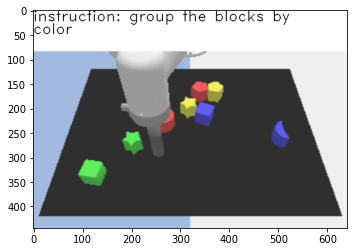

In [ ]:
time_step = env.reset()
plt.imshow(env.render())

In [ ]:
print(time_step.observation['rgb'].shape)

(4, 180, 320, 3)


In [ ]:
def central_crop(input_, *, width_over_height: float):
    """LargestCenterCrop transform."""
    in_shape = tf.shape(input_)
    H, W = in_shape[-3], in_shape[-2]  # pylint: disable=invalid-name
    aspect_ratio = width_over_height
    w_from_aspect_ratio = tf.cast(
        tf.cast(H, tf.float32) * aspect_ratio, tf.int32)
    h_from_aspect_ratio = tf.cast(
        tf.cast(W, tf.float32) / aspect_ratio, tf.int32)
    # Height/width of our crop.
    h = tf.minimum(H, h_from_aspect_ratio)
    w = tf.minimum(W, w_from_aspect_ratio)
    # Location of our crop.
    x = (H - h) // 2
    y = (W - w) // 2
    cropped = input_[..., x:x+h, y:y+w, :]
    return cropped

def prep_environment(orig_video):
    orig_video = orig_video * 255.

    F, H, W, C = (16, 24, 40, 3)
    cropped = central_crop(orig_video, width_over_height=float(W) / float(H))
    resized = tf.clip_by_value(
        tf.image.resize(cropped, [H, W], method="bilinear", antialias=True),
        0, 255)

    F, H, W, C = (16, 192, 320, 3)
    cropped_hi_res = central_crop(orig_video, width_over_height=float(W) / float(H))
    resized_hi_res = tf.clip_by_value(
        tf.image.resize(cropped_hi_res, [H, W], method="bilinear", antialias=True),
        0, 255)

    return {'base': resized.numpy(), 'ssr2': resized_hi_res.numpy()}

In [ ]:
base_env = env.wrapped_env().wrapped_env().wrapped_env()
language_table_env = base_env.gym.unwrapped

In [ ]:
type(language_table_env)

language_table.environments.language_table.LanguageTable

In [ ]:
language_table_env._blocks_on_table

('red_moon',
 'red_pentagon',
 'blue_moon',
 'blue_cube',
 'green_cube',
 'green_star',
 'yellow_star',
 'yellow_pentagon')

In [ ]:
state = language_table_env.compute_state()

In [ ]:
state.keys()

odict_keys(['effector_target_to_start_block_translation', 'start_block_orientation', 'block_red_moon_translation', 'block_red_moon_orientation', 'block_red_moon_mask', 'block_red_cube_translation', 'block_red_cube_orientation', 'block_red_cube_mask', 'block_red_star_translation', 'block_red_star_orientation', 'block_red_star_mask', 'block_red_pentagon_translation', 'block_red_pentagon_orientation', 'block_red_pentagon_mask', 'block_blue_moon_translation', 'block_blue_moon_orientation', 'block_blue_moon_mask', 'block_blue_cube_translation', 'block_blue_cube_orientation', 'block_blue_cube_mask', 'block_blue_star_translation', 'block_blue_star_orientation', 'block_blue_star_mask', 'block_blue_pentagon_translation', 'block_blue_pentagon_orientation', 'block_blue_pentagon_mask', 'block_yellow_moon_translation', 'block_yellow_moon_orientation', 'block_yellow_moon_mask', 'block_yellow_cube_translation', 'block_yellow_cube_orientation', 'block_yellow_cube_mask', 'block_yellow_star_translation'

In [ ]:
state['block_red_moon_translation']


array([0.38834912, 0.00750707], dtype=float32)

In [ ]:
state['block_green_pentagon_translation']

array([4.824268 , 5.4356127], dtype=float32)

In [ ]:
state['block_green_star_translation']

array([ 0.49507928, -0.02777041], dtype=float32)

In [ ]:
state['block_green_cube_translation']

array([0.24898453, 0.00262288], dtype=float32)

In [ ]:
state['block_green_pentagon_mask']

array([0.], dtype=float32)

In [ ]:
def get_object_state(env):
  blocks = env._blocks_on_table
  translation_dict = {}
  orientation_dict = {}
  state = env.compute_state()

  for block in blocks:
    trans = state['block_{}_translation'.format(block)]
    orientation = state['block_{}_orientation'.format(block)]
    translation_dict[block] = trans
    orientation_dict[block] = orientation

  return translation_dict, orientation_dict

In [ ]:
def set_state(env, block, trans):
  block_id = env._block_to_pybullet_id[block]
  trans_old, orientation_old = env._pybullet_client.getBasePositionAndOrientation(block_id)
  center_offset = language_table_env._target_effector_pose.translation[0:2]

  trans_new = [trans[0], trans[1], trans_old[2]]

  env._pybullet_client.resetBasePositionAndOrientation(block_id, trans_new, orientation_old)
  return

In [ ]:
im = env.render()

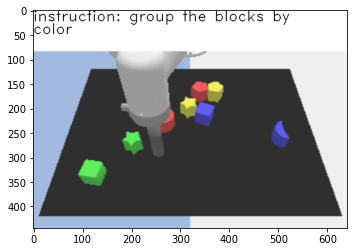

In [ ]:
plt.imshow(im)

In [ ]:
trans_dict, orientation_dict = get_object_state(language_table_env)

In [ ]:
trans_dict

{'blue_cube': array([0.32169852, 0.03544148], dtype=float32),
 'blue_moon': array([0.38753664, 0.21020481], dtype=float32),
 'green_cube': array([ 0.48978975, -0.20940699], dtype=float32),
 'green_star': array([ 0.4108332 , -0.13511413], dtype=float32),
 'red_moon': array([ 0.34938812, -0.05499334], dtype=float32),
 'red_pentagon': array([0.23972675, 0.02636155], dtype=float32),
 'yellow_pentagon': array([0.24194771, 0.06721321], dtype=float32),
 'yellow_star': array([ 0.29827213, -0.00267015], dtype=float32)}

In [ ]:
X_MIN = 0.15 # top of board
X_MAX = 0.55 # bottom of board
Y_MIN = -0.3048 # left of board
Y_MAX = 0.3048 # right of board

In [ ]:
set_state(language_table_env, 'blue_cube', [0.3069852, -0.15])

In [ ]:
im = env.render()

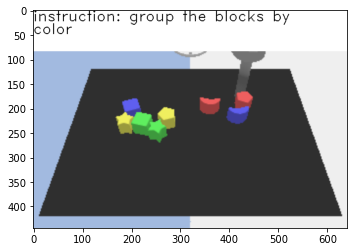

In [ ]:
plt.imshow(im)

In [ ]:
language_table_env._target_effector_pose.translation[0:2]

array([ 0.42991533, -0.07483322])

In [ ]:
language_table_env._block_to_pybullet_id

{'blue_cube': 9,
 'blue_moon': 8,
 'blue_pentagon': 11,
 'blue_star': 10,
 'green_cube': 17,
 'green_moon': 16,
 'green_pentagon': 19,
 'green_star': 18,
 'red_cube': 5,
 'red_moon': 4,
 'red_pentagon': 7,
 'red_star': 6,
 'yellow_cube': 13,
 'yellow_moon': 12,
 'yellow_pentagon': 15,
 'yellow_star': 14}

In [ ]:
trans_dict, orientation_dict = get_object_state(language_table_env)

In [ ]:
trans_dict

{'blue_cube': array([0.32169852, 0.03544148], dtype=float32),
 'blue_moon': array([0.38753664, 0.21020481], dtype=float32),
 'green_cube': array([ 0.48978975, -0.20940699], dtype=float32),
 'green_star': array([ 0.4108332 , -0.13511413], dtype=float32),
 'red_moon': array([ 0.34938812, -0.05499334], dtype=float32),
 'red_pentagon': array([0.23972675, 0.02636155], dtype=float32),
 'yellow_pentagon': array([0.24194771, 0.06721321], dtype=float32),
 'yellow_star': array([ 0.29827213, -0.00267015], dtype=float32)}

In [ ]:
orientation_dict

{'blue_cube': array([1.2113785], dtype=float32),
 'blue_moon': array([0.12969555], dtype=float32),
 'green_cube': array([-0.17569378], dtype=float32),
 'green_star': array([-2.7774973], dtype=float32),
 'red_moon': array([2.5240302], dtype=float32),
 'red_pentagon': array([-1.8542131], dtype=float32),
 'yellow_pentagon': array([2.5995314], dtype=float32),
 'yellow_star': array([0.70510864], dtype=float32)}

In [ ]:
def line_reward_function(env):
  trans_dict, orientation_dict = get_object_state(env)
  trans = []

  for k, v in trans_dict.items():
    trans.append(v)

  trans = np.array(trans)
  trans_center = np.mean(trans, axis=0)

  reward_horizontal = 0.0
  reward_vertical = 0.0

  for t in trans:
    horizontal_correct = np.linalg.norm(t[0] - 0.35) < 0.05
    # vertical_correct = np.linalg.norm(t[1] - trans_center[1]) < 0.05

    if horizontal_correct:
      reward_horizontal = reward_horizontal + 0.125

    # if vertical_correct:
    #   reward_vertical = reward_vertical + 0.125

  reward = max(reward_horizontal, reward_vertical)

  return reward

In [ ]:
def pairwise_reward_function(env):
  trans_dict, orientation_dict = get_object_state(env)

  red_trans = []
  blue_trans = []
  yellow_trans = []
  green_trans = []

  for k, v in trans_dict.items():
    if "red" in k:
      red_trans.append(v)

    if "blue" in k:
      blue_trans.append(v)

    if "yellow" in k:
      yellow_trans.append(v)

    if "green" in k:
      green_trans.append(v)

  red_trans = np.array(red_trans)
  blue_trans = np.array(blue_trans)
  yellow_trans = np.array(yellow_trans)
  green_trans = np.array(green_trans)

  reward = 0.0

  if np.linalg.norm(red_trans[0] - red_trans[1]) < 0.1:
    reward = reward + 0.25

  if np.linalg.norm(blue_trans[0] - blue_trans[1]) < 0.1:
    reward = reward + 0.25

  if np.linalg.norm(yellow_trans[0] - yellow_trans[1]) < 0.1:
    reward = reward + 0.25

  if np.linalg.norm(green_trans[0] - green_trans[1]) < 0.1:
    reward = reward + 0.25


  return reward


In [ ]:
def region_reward_function(env, region):
  # top left is X_MIN, Y_MIN
  # bottom left is X_MAX, Y_MIN
  # top right is X_MIN, Y_MAX
  # bottom right is X_MAX, Y_MAX
  assert region in ['top right', 'top left', 'bottom right', 'bottom left']

  if region == 'top right':
    target = np.array([X_MIN, Y_MAX])
  elif region == 'top left':
    target = np.array([X_MIN, Y_MIN])
  elif region == 'bottom right':
    target = np.array([X_MAX, Y_MAX])
  elif region == 'bottom left':
    target = np.array([X_MAX, Y_MIN])

  trans_dict, orientation_dict = get_object_state(env)
  reward = 0.0

  for k, v in trans_dict.items():
    v = np.array(v)
    # x_valid = np.linalg.norm(v[0] - target[0]) < 0.15
    # y_valid = np.linalg.norm(v[1] - target[1]) < 0.18
    x_valid = np.linalg.norm(v[0] - target[0]) < 0.20
    y_valid = np.linalg.norm(v[1] - target[1]) < 0.27

    if x_valid and y_valid:
      reward = reward + 0.125

  return reward

In [ ]:
def base_language_env(env):
  base_env = env.wrapped_env().wrapped_env().wrapped_env()
  language_table_env = base_env.gym.unwrapped
  return language_table_env

In [ ]:
language_table_env = base_language_env(env)

In [ ]:
language_table_env

In [ ]:
area

'bottom left'

In [ ]:
time_step.observation['instruction']

array([[112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0]], dtype=int32)

In [ ]:
clip_tokenizer_wrapper = lt_wrappers.ClipTokenWrapper(env)
from language_table.environments import language_table as lt

In [ ]:
# Prepare env.
lava_env = environments.registration.as_tfa_py_environment('language_table/Play8Block-v0', add_invisible_walls=True)
lava_env = lt_wrappers.CentralCropImageWrapper(
        lava_env,
        target_height=180,
        target_width=320,
        random_crop_factor=0.95)
lava_env = lt_wrappers.ClipTokenWrapper(lava_env)
lava_env = wrappers.HistoryWrapper(
    lava_env, history_length=4, tile_first_step_obs=True)

/export/hda3/borglet/remote_hdd_fs_dirs/0.yilund_language-table-high_63291438.1.kernel.yilund.3842556525916.14b334fb3717c109/mount/server/notebook.par/google3/third_party/py/gym/logger.py:34: UserWarning: WARN: Box bound precision lowered by casting to float32


In [ ]:
# Full code for autonomous evalaution in environment


for env_eval in range(7, 50):
  goal = 'group the blocks by color'
  time_step = env.reset()
  img_list = []
  beam_width = 2
  max_reward = 0

  for i in range(25):
    cond_init = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))
    plan_it = [[("start instruction", cond_init)] for i in range(beam_width)]
    plan = generate_plan(goal, plan_it, horizon=2, beam_width=beam_width)

    ssr2_videos = [a[1]['ssr2'] for a in plan[0][1:]]
    ssr2_video = np.concatenate(ssr2_videos, axis=0)
    sample_select = ssr2_video[:, 6:-6] / 255.

    terminate = False

    for ts in range(14, 15):

      if terminate:
        break

      for _ in range(60):
        time_step.observation['rgb'] = np.concatenate([time_step.observation['rgb'][1:], sample_select[ts:ts+1]], axis=0)

        obs_distance = np.linalg.norm(time_step.observation['rgb'][-2] - sample_select[ts])
        print(ts, ": im_distance: ", obs_distance)

        # if obs_distance > 70:
        #   terminate = True
        #   break

        reward = pairwise_reward_function(language_table_env)
        print("reward: ", reward)

        max_reward = max(max_reward, reward)
        if reward == 1:
          terminate = True
          break

        action_step = policy.action(time_step, ())
        next_time_step = env.step(action_step.action)

        if next_time_step.reward > 0.0:
          print('Success')
          break

        time_step = next_time_step
        img_list.append(time_step.observation['rgb'][-2])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/ablations/action/final/'
  with video_writer.write("{}/{}_{}.webm".format(file_prefix, env_eval, max_reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

Streaming output truncated to the last 5000 lines.
14 : im_distance:  43.11801
reward:  0.5
14 : im_distance:  43.03627
reward:  0.5
14 : im_distance:  43.133335
reward:  0.5
14 : im_distance:  43.284435
reward:  0.5
14 : im_distance:  43.42121
reward:  0.5
14 : im_distance:  43.261627
reward:  0.5
14 : im_distance:  43.020195
reward:  0.5
14 : im_distance:  42.936054
reward:  0.5
14 : im_distance:  42.951996
reward:  0.5
14 : im_distance:  42.9624
reward:  0.5
14 : im_distance:  42.99566
reward:  0.5
14 : im_distance:  43.128216
reward:  0.5
14 : im_distance:  43.20669
reward:  0.5
14 : im_distance:  43.219315
reward:  0.5
14 : im_distance:  43.223362
reward:  0.5
14 : im_distance:  43.34395
reward:  0.5
14 : im_distance:  43.439663
reward:  0.5
14 : im_distance:  43.363186
reward:  0.5
14 : im_distance:  43.098083
reward:  0.5
14 : im_distance:  42.770626
reward:  0.5
14 : im_distance:  42.503204
reward:  0.5
horizon:  0
batch:  0
text_emb shape:  (16, 64, 4096)
cond_frames shape:  (

In [ ]:
for env_eval in range(50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []
  area = random.choice(["bottom left", "bottom right", "top left", "top right"])
  goal = 'put all the blocks in the {} corner'.format(area)

  bytes_list = lt.LanguageTable.encode_instruction(goal)
  tokens = clip_tokenizer_wrapper._tokenize(bytes_list)

  for i in range(1500):
    reward = region_reward_function(language_table_env, area)
    print("reward: ", reward)
    time_step.observation['rgb'] = time_step.observation['rgb']
    time_step.observation['instruction'][:] = bytes_list
    time_step.observation['instruction_tokenized_clip'][:] = tokens

    max_reward = max(max_reward, reward)

    if reward == 1:
      break

    action_step = long_horizon_policy.action(time_step, ())
    next_time_step = lava_env.step(action_step.action)

    if next_time_step.reward > 0.0:
      print('Success')
      break

    time_step = next_time_step
    img_list.append(time_step.observation['rgb'][-1])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/lava/area/'
  with video_writer.write("{}/{}_{}_{}.webm".format(file_prefix, env_eval, area, max_reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

  break

env_eval:  0
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.3

In [ ]:
for env_eval in range(1, 50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []

  goal = 'group the blocks by color'

  bytes_list = lt.LanguageTable.encode_instruction(goal)
  tokens = clip_tokenizer_wrapper._tokenize(bytes_list)

  for i in range(1500):
    reward = pairwise_reward_function(language_table_env)
    print("reward: ", reward)
    time_step.observation['rgb'] = time_step.observation['rgb']
    time_step.observation['instruction'][:] = bytes_list
    time_step.observation['instruction_tokenized_clip'][:] = tokens

    max_reward = max(max_reward, reward)

    if reward == 1:
      break

    action_step = long_horizon_policy.action(time_step, ())
    next_time_step = lava_env.step(action_step.action)

    if next_time_step.reward > 0.0:
      print('Success')
      break

    time_step = next_time_step
    img_list.append(time_step.observation['rgb'][-1])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/lava/pair/'
  with video_writer.write("{}/{}_{}.webm".format(file_prefix, env_eval, max_reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

env_eval:  1
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0

KeyboardInterrupt: ignored

In [ ]:
beam_width = 2
language_table_env = base_language_env(lava_env)

for env_eval in range(50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []
  area = random.choice(["bottom left", "bottom right", "top left", "top right"])
  goal = 'put all the blocks in the {} corner'.format(area)


  for i in range(24):

    video = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))


    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]

    actions = generate_action(im_obs, goal, n=1, temp=0.3)
    action = actions[0]

    bytes_list = lt.LanguageTable.encode_instruction(goal)
    tokens = clip_tokenizer_wrapper._tokenize(bytes_list)

    terminate = False

    for ts in range(60):
      reward = region_reward_function(language_table_env, area)
      print("reward: ", reward)

      max_reward = max(max_reward, reward)
      if reward == 1:
        terminate = True
        break

      time_step.observation['instruction'][:] = bytes_list
      time_step.observation['instruction_tokenized_clip'][:] = tokens

      action_step = short_horizon_policy.action(time_step, ())
      next_time_step = lava_env.step(action_step.action)

      if next_time_step.reward > 0.0:
        print('Success')
        break

      time_step = next_time_step
      img_list.append(time_step.observation['rgb'][-2])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/palme/area/'
  with video_writer.write("{}/{}_{}_{}.webm".format(file_prefix, env_eval, area, max_reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

Streaming output truncated to the last 5000 lines.
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
rewa

In [ ]:
beam_width = 2
language_table_env = base_language_env(lava_env)

for env_eval in range(50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []
  goal = 'group the blocks by color'


  for i in range(24):

    video = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))


    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]

    actions = generate_action(im_obs, goal, n=1, temp=0.3)
    action = actions[0]

    bytes_list = lt.LanguageTable.encode_instruction(goal)
    tokens = clip_tokenizer_wrapper._tokenize(bytes_list)

    terminate = False

    for ts in range(60):
      reward = pairwise_reward_function(language_table_env,)
      print("reward: ", reward)

      max_reward = max(max_reward, reward)
      if reward == 1:
        terminate = True
        break

      time_step.observation['instruction'][:] = bytes_list
      time_step.observation['instruction_tokenized_clip'][:] = tokens

      action_step = short_horizon_policy.action(time_step, ())
      next_time_step = lava_env.step(action_step.action)

      if next_time_step.reward > 0.0:
        print('Success')
        break

      time_step = next_time_step
      img_list.append(time_step.observation['rgb'][-2])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/palme/pair/'
  with video_writer.write("{}/{}_{}.webm".format(file_prefix, env_eval, max_reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

Streaming output truncated to the last 5000 lines.
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.

In [ ]:
# Full code for autonomous evalaution in environment

# goal = 'group the blocks by color'

# goal = 'make one horizontal line out of the blue and yellow blocks, then make a vertical line out of the red and green blocks'

beam_width = 2

for env_eval in range(50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = env.reset()
  img_list = []
  area = random.choice(["bottom left", "bottom right", "top left", "top right"])
  goal = 'put all the blocks in the {} corner'.format(area)


  for i in range(25):

    # if i < 6:
    #   ts_end = 32
    # else:
    ts_end = 15

    cond_init = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))
    plan_it = [[("start instruction", cond_init)] for i in range(beam_width)]
    plan = generate_plan(goal, plan_it, horizon=2, beam_width=beam_width)

    ssr2_videos = [a[1]['ssr2'] for a in plan[0][1:]]
    ssr2_video = np.concatenate(ssr2_videos, axis=0)
    sample_select = ssr2_video[:, 6:-6] / 255.

    terminate = False

    for ts in range(1, ts_end):

      if terminate:
        break

      for _ in range(4):
        time_step.observation['rgb'] = np.concatenate([time_step.observation['rgb'][1:], sample_select[ts:ts+1]], axis=0)

        obs_distance = np.linalg.norm(time_step.observation['rgb'][-2] - sample_select[ts])
        print(ts, ": im_distance: ", obs_distance)

        # if obs_distance > 70:
        #   terminate = True
        #   break

        reward = region_reward_function(language_table_env, area)
        print("reward: ", reward)

        max_reward = max(max_reward, reward)
        if reward == 1:
          terminate = True
          break

        action_step = policy.action(time_step, ())
        next_time_step = env.step(action_step.action)

        if next_time_step.reward > 0.0:
          print('Success')
          break

        time_step = next_time_step
        img_list.append(time_step.observation['rgb'][-2])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/sim/area_execution'
  with video_writer.write("{}/{}_{}_{}.webm".format(file_prefix, env_eval, area, max_reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

Streaming output truncated to the last 5000 lines.
reward:  0.375
7 : im_distance:  45.091496
reward:  0.375
7 : im_distance:  46.51947
reward:  0.375
7 : im_distance:  47.97935
reward:  0.375
7 : im_distance:  48.626312
reward:  0.375
8 : im_distance:  48.343544
reward:  0.375
8 : im_distance:  47.911106
reward:  0.375
8 : im_distance:  46.421455
reward:  0.375
8 : im_distance:  45.150913
reward:  0.375
9 : im_distance:  43.84494
reward:  0.375
9 : im_distance:  42.581852
reward:  0.375
9 : im_distance:  40.696987
reward:  0.5
9 : im_distance:  39.511375
reward:  0.5
10 : im_distance:  39.217583
reward:  0.5
10 : im_distance:  39.172417
reward:  0.5
10 : im_distance:  39.085907
reward:  0.5
10 : im_distance:  38.86362
reward:  0.5
11 : im_distance:  38.83675
reward:  0.5
11 : im_distance:  38.58695
reward:  0.5
11 : im_distance:  38.3771
reward:  0.5
11 : im_distance:  38.66241
reward:  0.5
12 : im_distance:  38.907085
reward:  0.5
12 : im_distance:  38.77052
reward:  0.5
12 : im_dist

In [ ]:
beam_width = 2
language_table_env = base_language_env(lava_env)

for env_eval in range(22, 50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []
  goal = 'put all the blocks in a horizontal line on the center of the board'


  for i in range(24):

    video = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))


    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]

    actions = generate_action(im_obs, goal, n=1, temp=0.3)
    action = actions[0]

    bytes_list = lt.LanguageTable.encode_instruction(goal)
    tokens = clip_tokenizer_wrapper._tokenize(bytes_list)

    terminate = False

    for ts in range(60):
      reward = line_reward_function(language_table_env,)
      print("reward: ", reward)

      max_reward = max(max_reward, reward)
      if reward == 1:
        terminate = True
        break

      time_step.observation['instruction'][:] = bytes_list
      time_step.observation['instruction_tokenized_clip'][:] = tokens

      action_step = short_horizon_policy.action(time_step, ())
      next_time_step = lava_env.step(action_step.action)

      if next_time_step.reward > 0.0:
        print('Success')
        break

      time_step = next_time_step
      img_list.append(time_step.observation['rgb'][-2])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/palme/line/'
  with video_writer.write("{}/{}_{}.webm".format(file_prefix, env_eval, reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

Streaming output truncated to the last 5000 lines.
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.

In [ ]:
def parse_action_text(actions):
  action = actions[:5].split(" ")
  x, y = int(action[0]), int(action[1])

  if y > 19:
    y = int(action[1][:1])

  act_min = -0.03
  act_max = 0.03

  x = x / 19 * (act_max - act_min) + act_min
  y = y / 19 * (act_max - act_min) + act_min

  return np.array([x, y])

In [ ]:
beam_width = 2
language_table_env = base_language_env(lava_env)

for env_eval in range(1, 50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []
  goal = 'put all the blocks in a horizontal line on the center of the board'


  for i in range(1500):

    video = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))

    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]
    actions = generate_action_rt2(im_obs, n=1, temp=0.2)

    action = actions[0]
    action = parse_action_text(action)

    terminate = False

    reward = line_reward_function(language_table_env,)
    print("reward: ", reward)

    max_reward = max(max_reward, reward)
    if reward == 1:
      terminate = True
      break

    next_time_step = lava_env.step(action)

    if next_time_step.reward > 0.0:
      print('Success')
      break

    time_step = next_time_step
    img_list.append(time_step.observation['rgb'][-1])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/rt2/line/'
  with video_writer.write("{}/{}_{}.webm".format(file_prefix, env_eval, reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))


Streaming output truncated to the last 5000 lines.
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.375
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.375
reward:  0.375
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
reward:  0.25
re

In [ ]:
beam_width = 2
language_table_env = base_language_env(lava_env)

for env_eval in range(50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []
  goal = 'group the blocks by color'


  for i in range(1500):

    video = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))

    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]
    actions = generate_action_rt2(im_obs, n=1, temp=0.0)

    action = actions[0]
    action = parse_action_text(action)

    terminate = False

    reward = pairwise_reward_function(language_table_env,)
    print("reward: ", reward)

    max_reward = max(max_reward, reward)
    if reward == 1:
      terminate = True
      break

    next_time_step = lava_env.step(action)

    if next_time_step.reward > 0.0:
      print('Success')
      break

    time_step = next_time_step
    img_list.append(time_step.observation['rgb'][-1])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/rt2/pair/'
  with video_writer.write("{}/{}_{}.webm".format(file_prefix, env_eval, reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))


Streaming output truncated to the last 5000 lines.
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0
reward:  0.0


In [ ]:
beam_width = 2
language_table_env = base_language_env(lava_env)

for env_eval in range(50):

  print("env_eval: ", env_eval)
  max_reward = 0
  time_step = lava_env.reset()
  img_list = []
  area = random.choice(["bottom left", "bottom right", "top left", "top right"])
  goal = 'put all the blocks in the {} corner'.format(area)

  for i in range(1500):

    video = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))

    base_video = video['base']
    ssr2_video = video['ssr2']
    im_obs = ssr2_video[-1]
    actions = generate_action_rt2(im_obs, n=1, temp=0.0)

    action = actions[0]
    action = parse_action_text(action)

    terminate = False

    reward = region_reward_function(language_table_env, area)
    print("reward: ", reward)

    max_reward = max(max_reward, reward)
    if reward == 1:
      terminate = True
      break

    next_time_step = lava_env.step(action)

    if next_time_step.reward > 0.0:
      print('Success')
      break

    time_step = next_time_step
    img_list.append(time_step.observation['rgb'][-1])

    if max_reward == 1:
      break

  file_prefix = '/cns/rs-d/home/yilund/language_table/baselines_execution/rt2/area/'
  with video_writer.write("{}/{}_{}_{}.webm".format(file_prefix, env_eval, area, reward)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))


Streaming output truncated to the last 5000 lines.
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.25
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
reward:  0.125
rewar

In [ ]:
# Full code for autonomous evalaution in environment

goal = 'group the blocks by color'
# goal = 'put all the blocks in the bottom left'
# goal = 'make one horizontal line out of the blue and yellow blocks, then make a vertical line out of the red and green blocks'
# time_step = env.reset()
# img_list = []
beam_width = 2
max_reward = 0

for i in range(2):
  cond_init = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))
  plan_it = [[("start instruction", cond_init)] for i in range(beam_width)]
  plan = generate_plan(goal, plan_it, horizon=2, beam_width=beam_width)

  ssr2_videos = [a[1]['ssr2'] for a in plan[0][1:]]
  ssr2_video = np.concatenate(ssr2_videos, axis=0)
  sample_select = ssr2_video[:, 6:-6] / 255.

  terminate = False

  for ts in range(1, 15):

    if terminate:
      break

    for _ in range(4):
      time_step.observation['rgb'] = np.concatenate([time_step.observation['rgb'][1:], sample_select[ts:ts+1]], axis=0)

      obs_distance = np.linalg.norm(time_step.observation['rgb'][-2] - sample_select[ts])
      print(ts, ": im_distance: ", obs_distance)

      # if obs_distance > 70:
      #   terminate = True
      #   break

      # reward = region_reward_function(language_table_env, 'bottom left')
      reward = pairwise_reward_function(language_table_env)
      print("reward: ", reward)

      # max_reward = max(max_reward, reward)
      # if reward == 1:
        # terminate = True
        # break

      action_step = policy.action(time_step, ())
      next_time_step = env.step(action_step.action)

      if next_time_step.reward > 0.0:
        print('Success')
        break

      time_step = next_time_step
      img_list.append(time_step.observation['rgb'][-2])

  if max_reward == 1:
    break

  prefix = '/cns/rs-d/home/yilund/language_table/sim/line_execution'
  with video_writer.write("{}/debug.webm".format(prefix, i)) as vid:
    for frame in img_list[1:]:
      vid.add_frame((frame * 255).astype(np.uint8))

horizon:  0
batch:  0
text_emb shape:  (16, 64, 4096)
cond_frames shape:  (16, 16, 24, 40, 3)
plan steps:  -12.0
batch:  1
text_emb shape:  (16, 64, 4096)
cond_frames shape:  (16, 16, 24, 40, 3)
plan steps:  -28.0
2
2
horizon:  1
batch:  0
text_emb shape:  (16, 64, 4096)
cond_frames shape:  (16, 16, 24, 40, 3)
plan steps:  -12.0
batch:  1
text_emb shape:  (16, 64, 4096)
cond_frames shape:  (16, 16, 24, 40, 3)
plan steps:  -12.0
3
3
1 : im_distance:  53.45701
reward:  1.0
1 : im_distance:  111.172424
reward:  1.0
1 : im_distance:  114.97459
reward:  1.0
1 : im_distance:  118.981285
reward:  1.0
2 : im_distance:  122.15264
reward:  1.0
2 : im_distance:  118.545006
reward:  1.0
2 : im_distance:  110.0698
reward:  1.0
2 : im_distance:  95.918945
reward:  1.0
3 : im_distance:  64.04074
reward:  1.0
3 : im_distance:  65.619514
reward:  1.0
3 : im_distance:  75.28026
reward:  1.0
3 : im_distance:  98.84639
reward:  1.0
4 : im_distance:  87.88965
reward:  1.0
4 : im_distance:  87.975464
reward

NameError: ignored

In [ ]:
time_step

TimeStep(
{'discount': array(1., dtype=float32),
 'observation': OrderedDict([('effector_translation',
                              array([[ 0.24834986, -0.06699011],
       [ 0.2554559 , -0.07249188],
       [ 0.2603177 , -0.07445274],
       [ 0.26181933, -0.07484093],
       [ 0.26183024, -0.07543944]], dtype=float32)),
                             ('effector_target_translation',
                              array([[ 0.24866526, -0.06851998],
       [ 0.2559886 , -0.07398818],
       [ 0.26066124, -0.07561067],
       [ 0.2618561 , -0.07585154],
       [ 0.26172635, -0.07647185]], dtype=float32)),
                             ('instruction',
                              array([[112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0],
       [112, 117, 116, ...,   0,   0,   0]], dtype=int32)),
                             ('rgb',
                              array([[[[0.

In [ ]:
# Full code for autonomous evalaution in environment

goal = 'put all the blocks in a horizontal line on the center of the board'
# goal = 'put all the blocks in the bottom left'
# goal = 'make one horizontal line out of the blue and yellow blocks, then make a vertical line out of the red and green blocks'
time_step = env.reset()
img_list = []
beam_width = 1
max_reward = 0

for i in range(1):
  cond_init = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))
  plan_it = [[("start instruction", cond_init)] for i in range(beam_width)]
  plan = generate_plan(goal, plan_it, horizon=2, beam_width=beam_width)

  ssr2_videos = [a[1]['ssr2'] for a in plan[0][1:]]
  ssr2_video = np.concatenate(ssr2_videos, axis=0)
  sample_select = ssr2_video[:, 6:-6] / 255.

  terminate = False

  for ts in range(1, 15):

    if terminate:
      break

    for _ in range(4):
      time_step.observation['rgb'] = np.concatenate([time_step.observation['rgb'][1:], sample_select[ts:ts+1]], axis=0)

      obs_distance = np.linalg.norm(time_step.observation['rgb'][-2] - sample_select[ts])
      print(ts, ": im_distance: ", obs_distance)

      # if obs_distance > 70:
        # terminate = True
        # break

      # reward = region_reward_function(language_table_env, 'bottom left')
      # reward = pairwise_reward_function(language_table_env)
      reward = line_reward_function(language_table_env)
      print("reward: ", reward)

      max_reward = max(max_reward, reward)
      if reward == 1:
        terminate = True
        break

      action_step = policy.action(time_step, ())
      next_time_step = env.step(action_step.action)

      if next_time_step.reward > 0.0:
        print('Success')
        break

      time_step = next_time_step
      img_list.append(time_step.observation['rgb'][-2])

  if max_reward == 1:
    break

horizon:  0
batch:  0
text_emb shape:  (16, 64, 4096)
cond_frames shape:  (16, 16, 24, 40, 3)
plan steps:  -349.0
2
horizon:  1
batch:  0
text_emb shape:  (16, 64, 4096)
cond_frames shape:  (16, 16, 24, 40, 3)
plan steps:  -294.0
3
1 : im_distance:  56.3259
reward:  0.25
1 : im_distance:  47.563274
reward:  0.25
1 : im_distance:  39.71539
reward:  0.25
1 : im_distance:  38.067253
reward:  0.25
2 : im_distance:  46.13335
reward:  0.25
2 : im_distance:  42.84854
reward:  0.25
2 : im_distance:  37.303356
reward:  0.25
2 : im_distance:  38.41162
reward:  0.25
3 : im_distance:  44.816963
reward:  0.25
3 : im_distance:  41.812386
reward:  0.25
3 : im_distance:  37.474308
reward:  0.25
3 : im_distance:  38.40836
reward:  0.25
4 : im_distance:  39.4555
reward:  0.25
4 : im_distance:  41.41443
reward:  0.25
4 : im_distance:  41.55801
reward:  0.25
4 : im_distance:  38.13132
reward:  0.25
5 : im_distance:  37.929684
reward:  0.25
5 : im_distance:  38.51759
reward:  0.25
5 : im_distance:  38.0809

In [ ]:
video = np.stack(img_list[1:], axis=0)

In [ ]:
img_list[1].max()

0.97826207

In [ ]:
prefix = '/cns/rs-d/home/yilund/language_table/sim/line_execution'
with video_writer.write("{}/debug.webm".format(prefix, i)) as vid:
  for frame in img_list[1:]:
    vid.add_frame((frame * 255).astype(np.uint8))

In [ ]:
visualize(video * 255, fps=15)

duration: 116.60 sec. shape=(1, 1749, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 69.93 sec. shape=(1, 1049, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 15.93 sec. shape=(1, 239, 180, 320, 3)


In [ ]:
visualize(ssr2_video, fps=15)

duration: 1.07 sec. shape=(1, 16, 192, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 95.93 sec. shape=(1, 1439, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 7.40 sec. shape=(1, 111, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 18.73 sec. shape=(1, 281, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 24.80 sec. shape=(1, 372, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 24.80 sec. shape=(1, 372, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 7.40 sec. shape=(1, 111, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 13.53 sec. shape=(1, 203, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 18.60 sec. shape=(1, 279, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 37.27 sec. shape=(1, 559, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 54.67 sec. shape=(1, 820, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 62.13 sec. shape=(1, 932, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 74.60 sec. shape=(1, 1119, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 14.87 sec. shape=(1, 223, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 52.20 sec. shape=(1, 783, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 14.87 sec. shape=(1, 223, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 90.93 sec. shape=(1, 1364, 180, 320, 3)


In [ ]:
visualize(video * 255, fps=15)

duration: 18.60 sec. shape=(1, 279, 180, 320, 3)


In [ ]:
time_step.observation['rgb'].shape

(4, 4, 180, 320, 3)

In [ ]:
time_step.observation['rgb'].min()

0.18431373

In [ ]:
cond_init = prep_environment(np.tile(time_step.observation['rgb'][-1:], (12, 1, 1, 1)))


In [ ]:
cond_init.keys()

dict_keys(['base', 'ssr2'])

In [ ]:
beam_width = 1
plan_it = [[("start instruction", cond_init)] for i in range(beam_width)]

horizon:  0
batch:  0
text_emb shape:  (8, 64, 4096)
cond_frames shape:  (8, 16, 24, 40, 3)
plan steps:  -121.0
2
horizon:  1
batch:  0
text_emb shape:  (8, 64, 4096)
cond_frames shape:  (8, 16, 24, 40, 3)
plan steps:  -88.0
3
horizon:  2
batch:  0
text_emb shape:  (8, 64, 4096)
cond_frames shape:  (8, 16, 24, 40, 3)
plan steps:  -92.0
4
horizon:  3
batch:  0
text_emb shape:  (8, 64, 4096)
cond_frames shape:  (8, 16, 24, 40, 3)
plan steps:  -136.0
5


In [ ]:
ssr2_videos = [a[1]['ssr2'] for a in plan[0][1:]]

In [ ]:
ssr2_video = np.concatenate(ssr2_videos, axis=0)

In [ ]:
visualize(ssr2_video, fps=6)

duration: 10.67 sec. shape=(1, 64, 192, 320, 3)


In [ ]:
visualize(ssr2_video, fps=6)

duration: 10.67 sec. shape=(1, 64, 192, 320, 3)


In [ ]:
ssr2_video.shape

(64, 192, 320, 3)

In [ ]:
sample_select = ssr2_video[:, 6:-6] / 255.

In [ ]:
sample_select.shape

(64, 180, 320, 3)

In [ ]:
cond_video.shape
img_list = []

In [ ]:
for ts in range(1, 63):
  for _ in range(10):
    time_step.observation['rgb'] = np.concatenate([time_step.observation['rgb'][1:], sample_select[ts:ts+1]], axis=0)
    action_step = policy.action(time_step, ())
    next_time_step = env.step(action_step.action)

    if next_time_step.reward > 0.0:
      print('Success')
      break

    time_step = next_time_step
    img_list.append(time_step.observation['rgb'][-2])

In [ ]:
video = np.stack(img_list[1:], axis=0)

In [ ]:
visualize(video * 255, fps=15)

duration: 30.93 sec. shape=(1, 464, 180, 320, 3)


In [ ]:
video_util.display(np.asarray(img_list), 10);

In [ ]:
def decode_inst(inst):
  return bytes(inst[np.where(inst != 0)].tolist()).decode('utf8')

just_one_instruction = time_step.observation['instruction'][-1] # 0 is to index-out time
print(decode_inst(just_one_instruction))

make a rainbow out of the blocks (red, yellow, green, blue in a semicircle)


# Visualization Code


In [ ]:
video_util.display(np.asarray(img_list), 10);

/google/src/cloud/peteflorence/pf-nov-28/google3/blaze-bin/experimental/users/ayzaan/plato/notebook.runfiles/google3/learning/deepmind/visualization/python/image_array.py:152: UserWarning: float values outside of the range [0.0, 1.0] are clipped
  warnings.warn("float values outside of the range [0.0, 1.0] are clipped",


In [ ]:
def simple_visualize_dense(item):
  assert len(item['captions']) == len(item['start_times']) == len(item['end_times'])
  vis_img_list = []
  caption_index = -1
  for frame_index in range(len(item['video'])):
    # Get corresponding caption_index <-- assumes that they are sorted.
    for caption_index, val in enumerate(item['end_times']):
      if frame_index <= int(val):
        break
    caption = item['captions'][caption_index].numpy().decode('utf-8')
    img = tf.io.decode_png(item['video'][frame_index]).numpy()
    labeled_img = lt.add_debug_info_to_image(np.copy(img), {'instruction': caption})
    vis_img_list.append(labeled_img)
  video_util.display(np.asarray(vis_img_list), 30);


simple_visualize_dense(items[0])

In [ ]:
def simple_visualize_sparse(item):
  assert len(item['captions']) == len(item['start_times']) == len(item['end_times'])
  vis_img_list = []
  caption_index = -1
  for caption_index, val in enumerate(item['start_times']):
    caption = item['captions'][caption_index].numpy().decode('utf-8')
    img = tf.io.decode_png(item['video'][val]).numpy()
    labeled_img = lt.add_debug_info_to_image(np.copy(img), {'instruction': caption})
    vis_img_list.append(labeled_img)
  video_util.display(np.asarray(vis_img_list), 1)



simple_visualize_sparse(items[0])

""

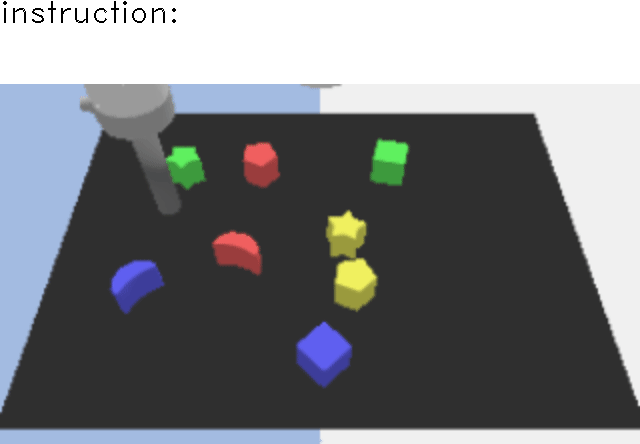

In [ ]:
from colabtools import adhoc_import
with adhoc_import.Google3():
  import mediapy

mediapy.show_video(labeled_img_list, height=444, codec='gif', fps=30)

In [ ]:
labeled_img_list[0].shape

(444, 640, 3)